# ENTREGA 2

## Daniel F. Gallo R.
## Sebastian A. Osorio R.
## Andres A. Pérez M.



Al igual que en la entrega 1, desde la base datos abiertos del gobierno, se extrajo un dataset donde se registran las armas incautadas por la Policía Nacional entre enero del 2010 y enero del 2021.  
La información está representada en un dataset de tipo secuencial-dinámico en forma de tabla.


In [46]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as plt
import matplotlib.pyplot as plt
import altair as alt
from matplotlib import cm
from math import log10
import plotly.express as px
from datetime import date

In [47]:
pd.set_option('display.max_columns', None)
sns.set(rc={'figure.figsize':(12.7,8.6)})

In [48]:
df= pd.read_csv('RP_ARMAS.CSV')
df.dropna()
del df['CODIGO DANE']
df

,DEPARTAMENTO,MUNICIPIO HECHO,CLASE BIEN,FECHA HECHO,CANTIDAD
0,ANTIOQUIA,FREDONIA,ESCOPETA,01/01/2010,1
1,ATLÁNTICO,BARRANQUILLA (CT),ESCOPETA,01/01/2010,1
2,BOLÍVAR,MARÍA LA BAJA,ESCOPETA,01/01/2010,1
3,BOYACÁ,SUTATENZA,ESCOPETA,01/01/2010,1
4,CESAR,AGUACHICA,ESCOPETA,01/01/2010,1
...,...,...,...,...,...
224375,TOLIMA,CHAPARRAL,PISTOLA,31/01/2021,1
224376,TOLIMA,CHAPARRAL,REVOLVER,31/01/2021,1
224377,VALLE,GUADALAJARA DE BUGA,REVOLVER,31/01/2021,1
224378,VALLE,LA VICTORIA,PISTOLA,31/01/2021,1


# VISUALIZACIONES DANIEL GALLO


## Visualización Datos Temporales - Gráfico de lineas


___¿Qué?___

En la siguiente visualización, el usuario encontrará la cantidad de armas incautadas por cada año desde el año 2010 hasta el 2020. Se omitió de los datos el año 2021 ya que al tener datos de solo dos meses crearía un sesgo en la gráfica.

___¿Por qué?___

La visualización presentada será util para que el usuario pueda **descubrir tendencias** sobre el proceso de incautación de armas en Colombia, especialmente cuando hubo un acuerdo de paz en el transcurso del periodo.

___¿Cómo?___

Mediante la visualización de un gráfico de líneas, será más facil para el usuario descubrir la tendencia y la evolución de las incautaciones durante los años seleccionados.



__Marcas y Canales__

Para un gráfico de línea se emplean marcas de líneas y canales de posición espacial vertical para el número de incautaciones y espacial horizontal para el atributo temporal.




In [49]:
df['FECHA HECHO'] = pd.to_datetime(df['FECHA HECHO'], infer_datetime_format=True)
df['Año']=df['FECHA HECHO'].dt.year


In [50]:
anual=df['Año'].value_counts().rename_axis('Año').reset_index(name='Incautaciones')
anual2020=anual.drop([11])
anual2020

,Año,Incautaciones
0,2010,27127
1,2011,24563
2,2012,24218
3,2013,22347
4,2014,21473
5,2015,20427
6,2016,18760
7,2017,17139
8,2018,16346
9,2019,15273


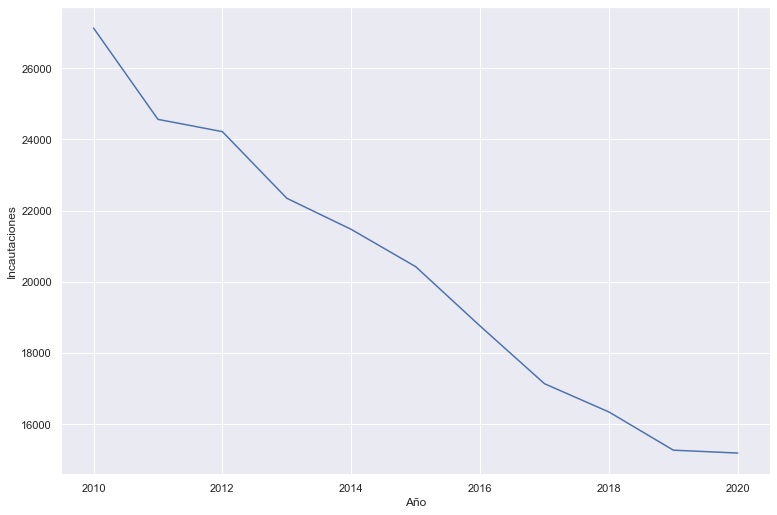

In [51]:
import matplotlib.ticker as mtick

sns.lineplot(data=anual2020, x="Año", y="Incautaciones")
plt.show()

### Posibles mejoras

Al ser tan marcada la distribución y la tendencia de esta serie, sería bueno desglozarla un poco mas a niveles mensuales, tipos de arma o datos para un departamento o un municipio en específico.


## Visualización Datos Espaciales - Coropleto

___¿Qué?___

En la siguiente visualización, el usuario encontrará la cantidad de incautaciones en cada departamento de Colombia. El total de todas las incautaciones hechas desde el 2010 hasta enero de 2021

___¿Por qué?___

La visualización presentada será util para que el usuario pueda **Localizar Distribuciones** sobre las incautaciones de armas en Colombia, discriminado por departamento.

___¿Cómo?___

Mediante la visualización de un mapa coropleto, el usuario diferenciará la intensidad de un departamento con respecto a otro de acuerdo con el color de cada uno, entre más amarillo sea representa una mayor cantidad de incautaciones.



__Marcas y Canales__

El mapa coropleto emplea marcas de área cualitativas y un  atributo de canal cuantitativo representado por el color.

In [52]:
import geopandas as gpd
import json

In [53]:
from urllib.request import urlopen

with urlopen('https://gist.githubusercontent.com/john-guerra/43c7656821069d00dcbc/raw/be6a6e239cd5b5b803c6e7c2ec405b793a9064dd/Colombia.geo.json') as response:
    departamentos = json.load(response)


In [54]:
tab_dptos=df['DEPARTAMENTO'].value_counts().rename_axis('Departamento').reset_index(name='Incautaciones')
tab_dptos.insert(0,"id", [5, 25, 76, 68, 8, 54, 13, 15, 52, 17, 20, 66, 19, 50, 47, 73, 44, 63, 41, 23, 70, 85, 18, 27, 86, 95, 81, 99, 88, 91, 94, 97])

tab_dptos

,id,Departamento,Incautaciones
0,5,ANTIOQUIA,27250
1,25,CUNDINAMARCA,25562
2,76,VALLE,22678
3,68,SANTANDER,15122
4,8,ATLÁNTICO,14350
5,54,NORTE DE SANTANDER,11182
6,13,BOLÍVAR,8509
7,15,BOYACÁ,8284
8,52,NARIÑO,7833
9,17,CALDAS,7635


In [55]:
fig = px.choropleth_mapbox(tab_dptos, geojson=departamentos, 
                           locations='id', 
                           featureidkey = 'properties.DPTO',
                           color='Incautaciones',
                           mapbox_style="carto-positron",
                           zoom=5
                          )
fig.show()

##### Posibles Mejoras

Para una mejor comprensión de este mapa, lo primero sería conseguir un geojson en donde se represente el departamento de Antioquia, que es la primera gran falla del mapa, especialmente porque al desglozar los datos en una tabla, Antioquia es el que presenta mayor cantidad de incautaciones y tendría el tono amarillo más vivo del mapa.


### Visualización datos Multivariados - Radial Bar Chart

___¿Qué?___

En la siguiente visualización, el usuario encontrará las clases de armas que fueron incautadas representado en un subgrupo según su tipo de arma, esta división generalmente se da dependiendo del tipo de balas que estas usan. Se dividieron en 4 subgrupos: Pistolas, escopetas, fusiles y explosivos.

___¿Por qué?___

La visualización presentada será util para que el usuario pueda **indentificar los tipos** de armas que se estan usando en Colombia de manera ilegal.

___¿Cómo?___

Mediante la visualización de un Radial Chart Bar, el usuario podrá ver la distribución porcentual de cada tipo de arma que se emplea.



__Marcas y Canales__

El mapa coropleto emplea una marca de área radial para determinar la cuantía correspondiente a cada tipo y un atributo de canal de color para diferenciar los tipos de arma en cuestión.

In [17]:
tab_ArmasTipo=df['CLASE BIEN'].value_counts().rename_axis('Arma').reset_index(name='Incautaciones')
tab_ArmasTipo.insert(1,'Tipo', ['PISTOLAS', 'ESCOPETAS', 'PISTOLAS', 'ESCOPETAS', 'FUSILES', 'FUSILES', 'FUSILES', 'EXPLOSIVOS', 'FUSILES', 'EXPLOSIVOS', 'EXPLOSIVOS', 'EXPLOSIVOS', 'EXPLOSIVOS'])
tab_ArmasTipo

,Arma,Tipo,Incautaciones
0,REVOLVER,PISTOLAS,95474
1,ESCOPETA,ESCOPETAS,61445
2,PISTOLA,PISTOLAS,52594
3,ESCOPETA DE FISTO,ESCOPETAS,10518
4,FUSIL / RIFLE,FUSILES,2488
5,SUBAMETRALLADORA,FUSILES,883
6,CARABINA,FUSILES,528
7,LANZA GRANADAS,EXPLOSIVOS,192
8,AMETRALLADORA,FUSILES,146
9,MORTERO,EXPLOSIVOS,84


In [18]:
tab10=tab_ArmasTipo[['Tipo', 'Incautaciones']]
tab10

,Tipo,Incautaciones
0,PISTOLAS,95474
1,ESCOPETAS,61445
2,PISTOLAS,52594
3,ESCOPETAS,10518
4,FUSILES,2488
5,FUSILES,883
6,FUSILES,528
7,EXPLOSIVOS,192
8,FUSILES,146
9,EXPLOSIVOS,84


In [29]:
tab10 = pd.pivot_table(tab10, 
                                values='Incautaciones', 
                                index=['Tipo'], 
                                aggfunc=np.sum)
tab10 = pd.DataFrame(tab10)
tab10.reset_index(inplace=True)
tab10= tab10.rename(columns = {'index':'Fechas','Departamento':'Valor'})
tab10.dtypes
tab10.head()

tab11=tab10.sort_values(by=['Incautaciones'], ascending=False)
tab11

,Tipo,Incautaciones
3,PISTOLAS,148068
0,ESCOPETAS,71963
2,FUSILES,4045
1,EXPLOSIVOS,304


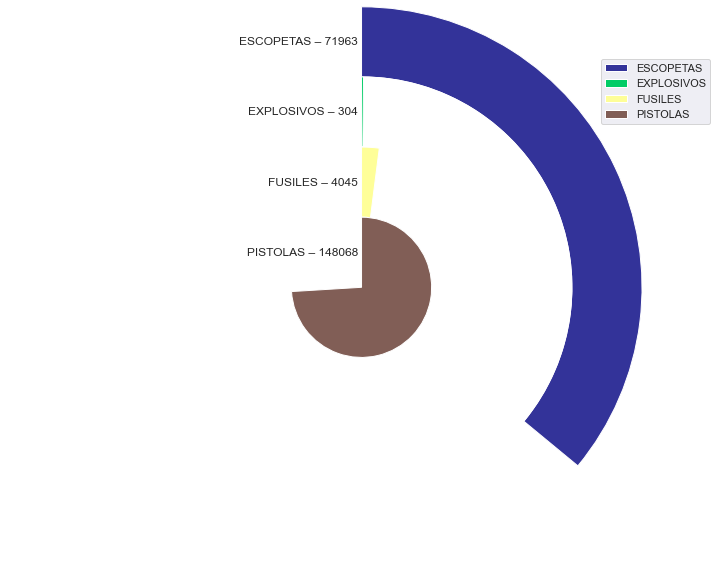

In [34]:
Tipo_de_armas = tab11['Tipo']
Incautaciones = tab11['Incautaciones']
n = len(Incautaciones)
k = 10 ** int(log10(max(Incautaciones)))
m = k * (1 + max(Incautaciones) // k)
r = 1.5
w = r / n 
colors = [cm.terrain(i / n) for i in range(n)]
fig, ax = plt.subplots()
ax.axis("equal")
for i in range(n):
    innerring, _ = ax.pie([m - Incautaciones[i], 
                           Incautaciones[i]], 
                          radius = r - i * w, 
                          startangle = 90, 
                          labels = ["", Tipo_de_armas[i]], 
                          labeldistance = 1 - 1 / (1.5 * (n - i)), 
                          textprops = {"alpha": 0}, 
                          colors = ["white", colors[i]])
    plt.setp(innerring, 
             width = w, 
             edgecolor = "white")
    radius = r - i * w
    plt.text(0, radius - w / 2, f'{Tipo_de_armas[i]} – {Incautaciones[i]} ', ha='right', va='center')
    
plt.legend()
plt.show()

### Posibles mejoras

Esta visualización tiene un inconveniente muy notorio visualmente y es de posición, los elementos están ordenados de manera alfabética y aunque la información sea verídica, no es agradable de ver para el usuario. La gran mejora de esta visualización sería ordenar los datos según su atributo cuantitativo y así darle una mejora visual a la visualización


# Visualizaciones Sebastian Osorio 

## Visualización Redes y Arboles (multivariados) - Treemap 

In [75]:
fig = px.treemap(df,
                 path=['DEPARTAMENTO', 'CLASE BIEN'],
                 color='DEPARTAMENTO',
                 )
        
fig.show()

## Datos Espaciales - Coropleto

In [70]:
df_escopeta = df[(df['CLASE BIEN'] == "ESCOPETA")]
tab_escopeta=df_escopeta['DEPARTAMENTO'].value_counts().rename_axis('Departamento').reset_index(name='Incautaciones')
tab_escopeta.insert(0,"id", [5, 25, 68, 17, 76, 52, 54, 20, 8, 13, 66, 15, 50, 63, 47, 19, 73, 70, 23, 44, 86, 41, 85, 18, 27, 99, 95, 81, 91, 94, 97, 88])
tab_escopeta


,id,Departamento,Incautaciones
0,5,ANTIOQUIA,9603
1,25,CUNDINAMARCA,7077
2,68,SANTANDER,4286
3,17,CALDAS,3553
4,76,VALLE,3466
5,52,NARIÑO,2778
6,54,NORTE DE SANTANDER,2744
7,20,CESAR,2653
8,8,ATLÁNTICO,2409
9,13,BOLÍVAR,2181


In [72]:
fig = px.choropleth_mapbox(tab_escopeta, geojson=departamentos, 
                           locations='id', 
                           featureidkey = 'properties.DPTO',
                           color='Incautaciones',
                           mapbox_style="carto-positron",
                           zoom=5
                          )
fig.show()

# Visualizaciones Andrés Perez

## Visualización Datos Temporales

In [78]:
df.loc[0,'FECHA HECHO'].day_name()

'Friday'

In [79]:
df['FECHA HECHO']=pd.to_datetime(df['FECHA HECHO'],format='%d/%m/%Y')

In [80]:
dfConteo = pd.pivot_table(df, 
                                values='CANTIDAD', 
                                index=['FECHA HECHO'], 
                                aggfunc=np.sum)
dfConteo = pd.DataFrame(dfConteo)
dfConteo.reset_index(inplace=True)
dfConteo= dfConteo.rename(columns = {'index':'Fechas','Departamento':'Valor'})
dfConteo.dtypes
dfConteo.head()

,FECHA HECHO,CANTIDAD
0,2010-01-01,143
1,2010-01-02,168
2,2010-01-03,119
3,2010-01-04,100
4,2010-01-05,135


In [81]:
sns.set(font_scale=1.4)

def reformat_large_tick_values(tick_val, pos):
    """
    Turns large tick values (in the billions, millions and thousands) such as 4500 into 4.5K and also appropriately turns 4000 into 4K (no zero after the decimal).
    """
    if tick_val >= 1000000000:
        val = round(tick_val/1000000000, 1)
        new_tick_format = '{:}B'.format(val)
    elif tick_val >= 1000000:
        val = round(tick_val/1000000, 1)
        new_tick_format = '{:}M'.format(val)
    elif tick_val >= 1000:
        val = round(tick_val/1000, 1)
        new_tick_format = '{:}K'.format(val)
    elif tick_val < 1000:
        new_tick_format = round(tick_val, 1)
    else:
        new_tick_format = tick_val

    # make new_tick_format into a string value
    new_tick_format = str(new_tick_format)
    
    # code below will keep 4.5M as is but change values such as 4.0M to 4M since that zero after the decimal isn't needed
    index_of_decimal = new_tick_format.find(".")
    
    if index_of_decimal != -1:
        value_after_decimal = new_tick_format[index_of_decimal+1]
        if value_after_decimal == "0":
            # remove the 0 after the decimal point since it's not needed
            new_tick_format = new_tick_format[0:index_of_decimal] + new_tick_format[index_of_decimal+2:]
            
    return new_tick_format

In [82]:
dfConteo = pd.pivot_table(df, 
                                values='CANTIDAD', 
                                index=['FECHA HECHO'], 
                                aggfunc=np.sum)
dfConteo = pd.DataFrame(dfConteo)
dfConteo.reset_index(inplace=True)
dfConteo= dfConteo.rename(columns = {'index':'Fechas','Departamento':'Valor'})
dfConteo.dtypes
dfConteo.head()

,FECHA HECHO,CANTIDAD
0,2010-01-01,143
1,2010-01-02,168
2,2010-01-03,119
3,2010-01-04,100
4,2010-01-05,135


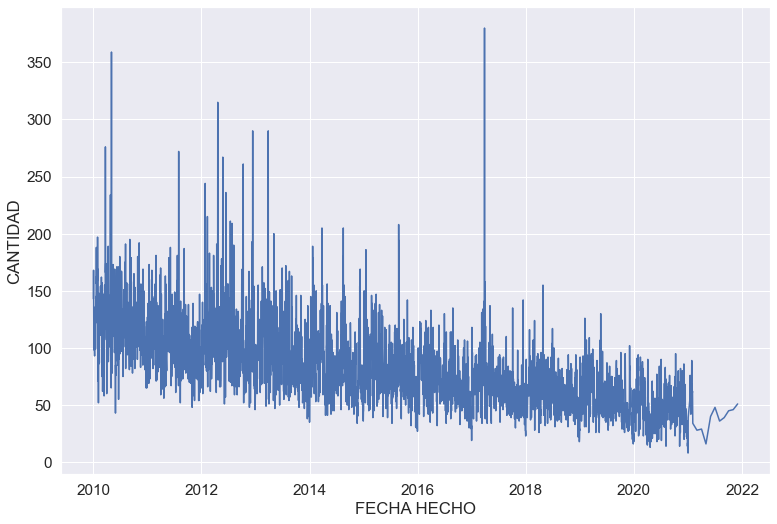

In [84]:
import matplotlib.ticker as tick
sns.lineplot(data=dfConteo, x="FECHA HECHO", y="CANTIDAD")
plt.ticklabel_format(style='plain', axis='y')
ax = plt.gca()
ax.yaxis.set_major_formatter(tick.FuncFormatter(reformat_large_tick_values))
plt.show()

Este es un grafico temporal de lineas las tares que ejecuta es comparar tendencias y similitudas, localicar valores atipicos

¿que?: En colombia existe conflicto armado, este se peude ver representado en las incautaciones de armas en el pais. 

¿por que?: El receptor peude encontrar informacion en la grafica de picos de incautacion y percibir y analizar como los vales han caido a lao largo del timepo


¿como?:la informacion se presenta por medio de un mapa temporal del lineas 

marcas: marca de lineas

Canales:canales de posicion horizontal y vertical 

mejoras: algun timpo de comparacion por estaciones o color seria bueno para el analisis

# Datos Multivariados

In [85]:
Conteo_tipoarmas = pd.pivot_table(df, 
                                values='CANTIDAD', 
                                index=['DEPARTAMENTO','CLASE BIEN'],
                                #columns=['Tipo de Contrato'], 
                                aggfunc=np.count_nonzero)
Conteo_tipoarmas = pd.DataFrame(Conteo_tipoarmas)
Conteo_tipoarmas.reset_index(inplace=True)
Conteo_tipoarmas = Conteo_tipoarmas.rename(columns = {'index':'ID','CANTIDAD':'Conteo'})
Conteo_tipoarmas

,DEPARTAMENTO,CLASE BIEN,Conteo
0,AMAZONAS,CARABINA,3
1,AMAZONAS,ESCOPETA,141
2,AMAZONAS,FUSIL / RIFLE,4
3,AMAZONAS,PISTOLA,97
4,AMAZONAS,REVOLVER,145
...,...,...,...
294,VICHADA,FUSIL / RIFLE,38
295,VICHADA,LANZA GRANADAS,2
296,VICHADA,PISTOLA,141
297,VICHADA,REVOLVER,166


In [86]:
tab1 = pd.crosstab(df["DEPARTAMENTO"],df["CLASE BIEN"])
tab1

CLASE BIEN,AMETRALLADORA,CARABINA,ESCOPETA,ESCOPETA DE FISTO,FUSIL / RIFLE,LANZA COHETES,LANZA GRANADAS,LANZA MISIL,MORTERO,PISTOLA,REVOLVER,ROCKET,SUBAMETRALLADORA
DEPARTAMENTO,,,,,,,,,,,,,
AMAZONAS,0,3,141,0,4,0,0,0,0,97,145,0,0
ANTIOQUIA,20,105,9603,87,564,1,31,1,13,5810,10747,1,267
ARAUCA,3,15,158,11,44,0,9,0,2,272,326,0,7
ATLÁNTICO,1,8,2409,3,22,0,0,0,0,6077,5790,0,40
BOLÍVAR,1,7,2181,27,71,0,3,0,0,1706,4506,0,7
BOYACÁ,1,22,2063,2879,29,0,1,0,3,1157,2122,0,7
CALDAS,3,6,3553,175,17,0,0,0,0,993,2871,0,17
CAQUETÁ,5,9,409,1004,60,0,6,0,4,626,901,0,7
CASANARE,0,35,698,508,24,0,3,0,0,721,1172,0,6


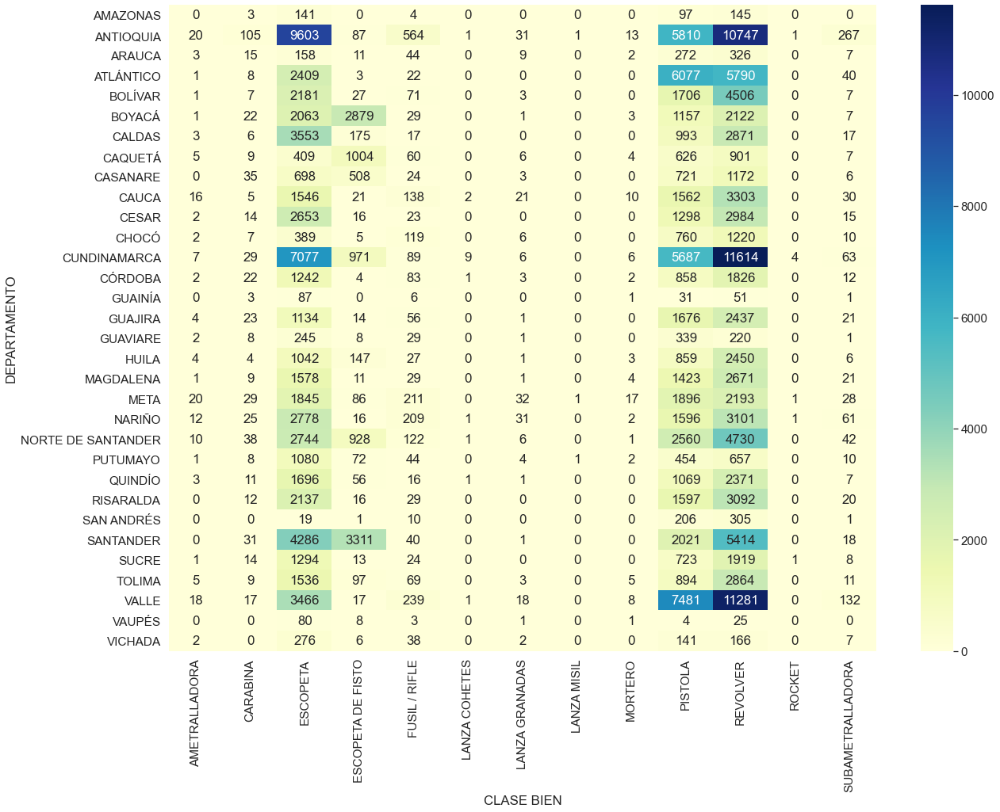

In [87]:
plt.subplots(figsize=(20,15))  
ax = sns.heatmap(tab1,
                 annot=True, 
                 fmt="d",
                 cmap="YlGnBu")

#### Este es un grafico de mapa de calor con valores incorporados 

¿que?:En colombia existe conflicto armado, este se puede ver representado en las incautaciones de armas en el pais.

¿por que?:El receptor peude acudir a esta vizualizacion y se dara cuenta de las disitinciones en color y numeros para los diferentes municipos y armas lo cual genera patrone sy es  interezante 

¿como?:Por medio del mapa de calor 

marcas: Por medio de marcas de valor numerico 

Canales: Por medio de canales de color y posicion vertical y horizontal  

mejoras: mejorar la disticion de los colores con una mejor paleta para aprovehcar la disposicion de la informacion

# Datos Espaciales

In [88]:
df_revolver = df[(df['CLASE BIEN'] == "REVOLVER")]
tab_revolver=df_revolver['DEPARTAMENTO'].value_counts().rename_axis('Departamento').reset_index(name='Incautaciones')
tab_revolver.insert(0,"id", [ 25,76,5,8,68,54,13,19,52,47,20,17,41,94,63,50,15,70,85,86,23,88,95,99,91,97,9,14,18,73,52,44])
tab_revolver

,id,Departamento,Incautaciones
0,25,CUNDINAMARCA,11614
1,76,VALLE,11281
2,5,ANTIOQUIA,10747
3,8,ATLÁNTICO,5790
4,68,SANTANDER,5414
5,54,NORTE DE SANTANDER,4730
6,13,BOLÍVAR,4506
7,19,CAUCA,3303
8,52,NARIÑO,3101
9,47,RISARALDA,3092


In [89]:
fig = px.choropleth_mapbox(tab_revolver, geojson=departamentos, 
                           locations='id', 
                           featureidkey = 'properties.DPTO',
                           color='Incautaciones',
                           mapbox_style="carto-positron",
                           zoom=5
                          )
fig.show()